In [48]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="s4FZabiIIE2JRuSa8MFn")
project = rf.workspace("krishi-oz05i").project("agrifarm-3zwm0")
version = project.version(12)
dataset = version.download("png-mask-semantic")
                

In [42]:
import os
import shutil

# Original folder containing mixed files
src_dir = "/kaggle/working/AGRIFARM-12/train"

# Destination folders
img_dest = "/kaggle/working/train/images"
mask_dest = "/kaggle/working/train/masks"

# Create destination folders if they don't exist
os.makedirs(img_dest, exist_ok=True)
os.makedirs(mask_dest, exist_ok=True)

# Move files
for f in os.listdir(src_dir):
    src_path = os.path.join(src_dir, f)
    if f.endswith(".jpg"):
        shutil.copy(src_path, os.path.join(img_dest, f))
    elif f.endswith("_mask.png"):
        shutil.copy(src_path, os.path.join(mask_dest, f))

print(f"✅ All images moved to {img_dest}")
print(f"✅ All masks moved to {mask_dest}")


✅ All images moved to /kaggle/working/train/images
✅ All masks moved to /kaggle/working/train/masks


In [43]:
import os
import shutil

# Original folder containing mixed files
src_dir = "/kaggle/working/AGRIFARM-12/valid"

# Destination folders
img_dest = "/kaggle/working/valid/images"
mask_dest = "/kaggle/working/valid/masks"

# Create destination folders if they don't exist
os.makedirs(img_dest, exist_ok=True)
os.makedirs(mask_dest, exist_ok=True)

# Move files
for f in os.listdir(src_dir):
    src_path = os.path.join(src_dir, f)
    if f.endswith(".jpg"):
        shutil.copy(src_path, os.path.join(img_dest, f))
    elif f.endswith("_mask.png"):
        shutil.copy(src_path, os.path.join(mask_dest, f))

print(f"✅ All images moved to {img_dest}")
print(f"✅ All masks moved to {mask_dest}")


✅ All images moved to /kaggle/working/valid/images
✅ All masks moved to /kaggle/working/valid/masks


In [44]:
import os
import shutil

# Original folder containing mixed files
src_dir = "/kaggle/working/AGRIFARM-12/test"

# Destination folders
img_dest = "/kaggle/working/test/images"
mask_dest = "/kaggle/working/test/masks"

# Create destination folders if they don't exist
os.makedirs(img_dest, exist_ok=True)
os.makedirs(mask_dest, exist_ok=True)

# Move files
for f in os.listdir(src_dir):
    src_path = os.path.join(src_dir, f)
    if f.endswith(".jpg"):
        shutil.copy(src_path, os.path.join(img_dest, f))
    elif f.endswith("_mask.png"):
        shutil.copy(src_path, os.path.join(mask_dest, f))

print(f"✅ All images moved to {img_dest}")
print(f"✅ All masks moved to {mask_dest}")


✅ All images moved to /kaggle/working/test/images
✅ All masks moved to /kaggle/working/test/masks


In [45]:
with open("/kaggle/working/AGRIFARM-12/valid/_classes.csv", "r") as f:
    for line in f:
        print(line.strip())  # remove trailing newline


Pixel Value, Class
0, background
1, Barrenland
2, Bush
3, Farmland
4, Sand
5, Tree
6, edgecase


In [ ]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from PIL import Image
from torch.optim import Adam
from tqdm import tqdm
import albumentations as A
from albumentations.pytorch import ToTensorV2

# ==========================================
# 1. CONFIGURATION
# ==========================================
CONFIG = {
    "ROOT_DIR": "/kaggle/working",       
    "IMG_SIZE": 512,
    "BATCH_SIZE": 4,
    "LR": 1e-4,
    "EPOCHS": 50,
    "PATIENCE": 10,               
    "NUM_CLASSES_TO_TRAIN": 5,    # 0:Back, 1:Barren, 2:Veg, 3:Farm, 4:Sand
    "IGNORE_INDEX": 255,          
    "DEVICE": "cuda" if torch.cuda.is_available() else "cpu",
    "MODEL_SAVE_PATH": "vgg16_unet_best_dice.pth"
}

# ==========================================
# 2. METRICS & EARLY STOPPING
# ==========================================

def compute_dice_score(preds, targets, num_classes, ignore_index=255):
    """
    Computes the Macro Dice Score (Average F1 across classes).
    Excludes the ignore_index pixels from the calculation.
    """
    # preds: (Batch, Num_Classes, H, W) -> need argmax
    pred_mask = torch.argmax(preds, dim=1) # (B, H, W)
    
    dice_list = []
    
    # We loop through each class to calculate Dice for that specific class
    for c in range(num_classes):
        # Create binary masks for class c
        p_c = (pred_mask == c)
        t_c = (targets == c)
        
        # 🚨 IMPORTANT: Mask out the ignore regions 🚨
        # We only care about pixels where ground truth is NOT ignore_index
        valid_pixels = (targets != ignore_index)
        
        # Apply the valid mask (Predictions in ignore regions shouldn't count)
        p_c = p_c & valid_pixels
        t_c = t_c & valid_pixels
        
        # Calculate Intersection and Union
        intersection = (p_c & t_c).sum().float()
        union = p_c.sum().float() + t_c.sum().float()
        
        # Avoid division by zero
        if union == 0:
            # If both pred and target are empty for this class, score is 1.0
            # If target exists but pred is empty, score is 0.0
            score = 1.0 if t_c.sum() == 0 else 0.0
        else:
            # Calculate tensor score, then convert to float
            score = ((2.0 * intersection) / (union + 1e-6)).item()
            
        dice_list.append(score)
        
    # Return mean dice across all classes (Macro Dice)
    return np.mean(dice_list)

class EarlyStoppingDice:
    """
    Early stops the training if validation DICE Score doesn't improve.
    (Maximizing mode)
    """
    def __init__(self, patience=7, verbose=False, delta=0, path='checkpoint.pth', trace_func=print):
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = -np.Inf # Initialize with -Infinity because we want to maximize Dice
        self.early_stop = False
        self.delta = delta
        self.path = path
        self.trace_func = trace_func

    def __call__(self, current_score, model):
        # Logic: Is current_score GREATER than best_score?
        if current_score > self.best_score + self.delta:
            self.best_score = current_score
            self.save_checkpoint(current_score, model)
            self.counter = 0 # Reset counter
        else:
            self.counter += 1
            self.trace_func(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True

    def save_checkpoint(self, score, model):
        if self.verbose:
            self.trace_func(f'Dice Score improved to {score:.4f}. Saving model ...')
        torch.save(model.state_dict(), self.path)

# ==========================================
# 3. DATASET CLASS
# ==========================================
class FarmDataset(Dataset):
    def __init__(self, root_dir, split="train"):
        self.img_dir = os.path.join(root_dir, split, "images")
        self.mask_dir = os.path.join(root_dir, split, "masks")
        self.images = sorted([f for f in os.listdir(self.img_dir) if f.endswith('.jpg')])
        
        self.transform = A.Compose([
            A.Resize(height=CONFIG['IMG_SIZE'], width=CONFIG['IMG_SIZE']),
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.RandomRotate90(p=0.5),
            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
            ToTensorV2()
        ]) if split == "train" else A.Compose([
            A.Resize(height=CONFIG['IMG_SIZE'], width=CONFIG['IMG_SIZE']),
            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
            ToTensorV2()
        ])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = self.images[idx]
        mask_name = img_name.replace(".jpg", "_mask.png")
        
        img_path = os.path.join(self.img_dir, img_name)
        mask_path = os.path.join(self.mask_dir, mask_name)

        image = np.array(Image.open(img_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"))

        # Remapping Logic
        new_mask = np.zeros_like(mask) # Default to 0 (Background)

        new_mask[mask == 1] = 1 # Barren
        new_mask[(mask == 2) | (mask == 5)] = 2 # Veg
        new_mask[mask == 3] = 3 # Farm
        new_mask[mask == 4] = 4 # Sand
        
        # Ignore logic
        new_mask[mask == 6] = CONFIG["IGNORE_INDEX"]
        new_mask[mask > 6] = CONFIG["IGNORE_INDEX"]

        augmentations = self.transform(image=image, mask=new_mask)
        return augmentations["image"], augmentations["mask"].long()

# ==========================================
# 4. MODEL
# ==========================================
class VGG16UNet(nn.Module):
    def __init__(self, num_classes, pretrained=True):
        super(VGG16UNet, self).__init__()
        vgg16 = models.vgg16_bn(weights=models.VGG16_BN_Weights.DEFAULT if pretrained else None)
        features = list(vgg16.features.children())

        self.enc1 = nn.Sequential(*features[:6])    
        self.enc2 = nn.Sequential(*features[6:13])  
        self.enc3 = nn.Sequential(*features[13:23]) 
        self.enc4 = nn.Sequential(*features[23:33]) 
        self.enc5 = nn.Sequential(*features[33:43]) 

        self.pool = nn.MaxPool2d(2, 2)

        self.up1 = self.conv_block(512 + 512, 512)
        self.up2 = self.conv_block(512 + 256, 256)
        self.up3 = self.conv_block(256 + 128, 128)
        self.up4 = self.conv_block(128 + 64, 64)

        self.final_conv = nn.Conv2d(64, num_classes, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        e1 = self.enc1(x)
        p1 = self.pool(e1)
        e2 = self.enc2(p1)
        p2 = self.pool(e2)
        e3 = self.enc3(p2)
        p3 = self.pool(e3)
        e4 = self.enc4(p3)
        p4 = self.pool(e4)
        e5 = self.enc5(p4)

        d1 = F.interpolate(e5, scale_factor=2, mode='bilinear', align_corners=True)
        if d1.size()[2:] != e4.size()[2:]:
            d1 = F.interpolate(d1, size=e4.shape[2:], mode='bilinear', align_corners=True)
        d1 = torch.cat([d1, e4], dim=1)
        d1 = self.up1(d1)

        d2 = F.interpolate(d1, scale_factor=2, mode='bilinear', align_corners=True)
        if d2.size()[2:] != e3.size()[2:]:
            d2 = F.interpolate(d2, size=e3.shape[2:], mode='bilinear', align_corners=True)
        d2 = torch.cat([d2, e3], dim=1)
        d2 = self.up2(d2)

        d3 = F.interpolate(d2, scale_factor=2, mode='bilinear', align_corners=True)
        if d3.size()[2:] != e2.size()[2:]:
            d3 = F.interpolate(d3, size=e2.shape[2:], mode='bilinear', align_corners=True)
        d3 = torch.cat([d3, e2], dim=1)
        d3 = self.up3(d3)

        d4 = F.interpolate(d3, scale_factor=2, mode='bilinear', align_corners=True)
        if d4.size()[2:] != e1.size()[2:]:
            d4 = F.interpolate(d4, size=e1.shape[2:], mode='bilinear', align_corners=True)
        d4 = torch.cat([d4, e1], dim=1)
        d4 = self.up4(d4)

        return self.final_conv(d4)

# ==========================================
# 5. TRAINING LOOP
# ==========================================
def train():
    print(f"--- Training VGG16 U-Net on {CONFIG['DEVICE']} ---")
    print(f"Monitor: Dice Score | Classes: {CONFIG['NUM_CLASSES_TO_TRAIN']}")
    
    model = VGG16UNet(num_classes=CONFIG['NUM_CLASSES_TO_TRAIN']).to(CONFIG['DEVICE'])
    
    # Setup Data
    train_ds = FarmDataset(CONFIG['ROOT_DIR'], split="train")
    if os.path.exists(os.path.join(CONFIG['ROOT_DIR'], "valid")):
        val_ds = FarmDataset(CONFIG['ROOT_DIR'], split="valid")
    else:
        print("Splitting train data for validation...")
        train_size = int(0.8 * len(train_ds))
        val_size = len(train_ds) - train_size
        train_ds, val_ds = torch.utils.data.random_split(train_ds, [train_size, val_size])

    train_loader = DataLoader(train_ds, batch_size=CONFIG['BATCH_SIZE'], shuffle=True, num_workers=2, pin_memory=True)
    val_loader = DataLoader(val_ds, batch_size=CONFIG['BATCH_SIZE'], shuffle=False, num_workers=2, pin_memory=True)

    # Loss & Optimizer
    # Using Label Smoothing to help with unannotated background noise
    criterion = nn.CrossEntropyLoss(
        ignore_index=CONFIG['IGNORE_INDEX'],
        label_smoothing=0.1 
    )
    optimizer = Adam(model.parameters(), lr=CONFIG['LR'])

    # Early Stopping on DICE Score
    early_stopping = EarlyStoppingDice(
        patience=CONFIG['PATIENCE'], 
        verbose=True, 
        path=CONFIG['MODEL_SAVE_PATH']
    )

    for epoch in range(CONFIG['EPOCHS']):
        model.train()
        train_loss = 0
        
        # Training
        loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{CONFIG['EPOCHS']}")
        for images, masks in loop:
            images = images.to(CONFIG['DEVICE'])
            masks = masks.to(CONFIG['DEVICE'])

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            loop.set_postfix(loss=loss.item())

        # Validation (Compute Loss AND Dice)
        model.eval()
        val_loss = 0
        val_dice_scores = []
        
        with torch.no_grad():
            for images, masks in val_loader:
                images = images.to(CONFIG['DEVICE'])
                masks = masks.to(CONFIG['DEVICE'])
                
                outputs = model(images)
                
                # 1. Compute Loss
                loss = criterion(outputs, masks)
                val_loss += loss.item()
                
                # 2. Compute Dice Score
                if outputs.shape[-2:] != masks.shape[-2:]:
                     outputs = F.interpolate(outputs, size=masks.shape[-2:], mode='bilinear', align_corners=False)

                batch_dice = compute_dice_score(
                    preds=outputs, 
                    targets=masks, 
                    num_classes=CONFIG['NUM_CLASSES_TO_TRAIN'],
                    ignore_index=CONFIG['IGNORE_INDEX']
                )
                val_dice_scores.append(batch_dice)

        avg_val_loss = val_loss / len(val_loader)
        avg_val_dice = np.mean(val_dice_scores)
        
        print(f"Val Loss: {avg_val_loss:.4f} | Val Dice: {avg_val_dice:.4f}")

        # Early Stopping check based on DICE
        early_stopping(avg_val_dice, model)
        
        if early_stopping.early_stop:
            print("Early stopping triggered on Dice Score.")
            break

    print("Training Complete.")

if __name__ == "__main__":
    train()

--- Training VGG16 U-Net on cuda ---
Monitor: Dice Score | Classes: 5


Epoch 1/50: 100%|██████████| 111/111 [00:27<00:00,  4.08it/s, loss=0.826]


Val Loss: 1.0559 | Val Dice: 0.4931
Dice Score improved to 0.4931. Saving model ...


Epoch 2/50: 100%|██████████| 111/111 [00:27<00:00,  4.08it/s, loss=0.89] 


Val Loss: 1.0253 | Val Dice: 0.4809
EarlyStopping counter: 1 out of 10


Epoch 3/50: 100%|██████████| 111/111 [00:27<00:00,  4.08it/s, loss=2.12] 


Val Loss: 1.1254 | Val Dice: 0.4272
EarlyStopping counter: 2 out of 10


Epoch 4/50: 100%|██████████| 111/111 [00:27<00:00,  4.08it/s, loss=1.06] 


Val Loss: 1.1561 | Val Dice: 0.4528
EarlyStopping counter: 3 out of 10


Epoch 5/50: 100%|██████████| 111/111 [00:27<00:00,  4.08it/s, loss=0.857]


Val Loss: 1.0209 | Val Dice: 0.4537
EarlyStopping counter: 4 out of 10


Epoch 6/50: 100%|██████████| 111/111 [00:27<00:00,  4.08it/s, loss=1.16] 


Val Loss: 0.9466 | Val Dice: 0.4444
EarlyStopping counter: 5 out of 10


Epoch 7/50: 100%|██████████| 111/111 [00:27<00:00,  4.08it/s, loss=1.56] 


Val Loss: 0.9381 | Val Dice: 0.5181
Dice Score improved to 0.5181. Saving model ...


Epoch 8/50: 100%|██████████| 111/111 [00:27<00:00,  4.08it/s, loss=0.832]


Val Loss: 0.8753 | Val Dice: 0.4996
EarlyStopping counter: 1 out of 10


Epoch 9/50: 100%|██████████| 111/111 [00:27<00:00,  4.08it/s, loss=0.519]


Val Loss: 0.8621 | Val Dice: 0.5127
EarlyStopping counter: 2 out of 10


Epoch 10/50: 100%|██████████| 111/111 [00:27<00:00,  4.08it/s, loss=0.778]


Val Loss: 0.8407 | Val Dice: 0.5418
Dice Score improved to 0.5418. Saving model ...


Epoch 11/50: 100%|██████████| 111/111 [00:27<00:00,  4.08it/s, loss=0.729]


Val Loss: 0.8608 | Val Dice: 0.4661
EarlyStopping counter: 1 out of 10


Epoch 12/50: 100%|██████████| 111/111 [00:27<00:00,  4.08it/s, loss=1.26] 


Val Loss: 0.9150 | Val Dice: 0.5307
EarlyStopping counter: 2 out of 10


Epoch 13/50: 100%|██████████| 111/111 [00:27<00:00,  4.08it/s, loss=0.922]


Val Loss: 0.8096 | Val Dice: 0.5564
Dice Score improved to 0.5564. Saving model ...


Epoch 14/50: 100%|██████████| 111/111 [00:27<00:00,  4.08it/s, loss=1.22] 


Val Loss: 0.8746 | Val Dice: 0.5492
EarlyStopping counter: 1 out of 10


Epoch 15/50: 100%|██████████| 111/111 [00:27<00:00,  4.08it/s, loss=1.45] 


Val Loss: 0.8766 | Val Dice: 0.5638
Dice Score improved to 0.5638. Saving model ...


Epoch 16/50:  48%|████▊     | 53/111 [00:13<00:14,  4.11it/s, loss=0.595]

Loading Model...
Weights loaded successfully.
Found 25 images.
Visualizing 5 samples...


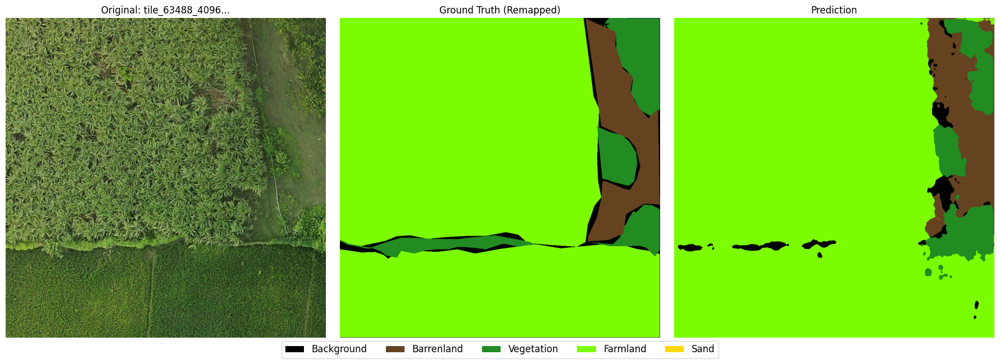

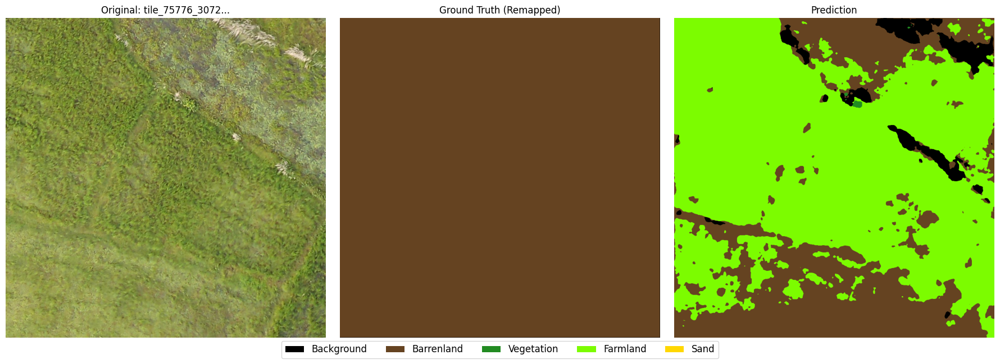

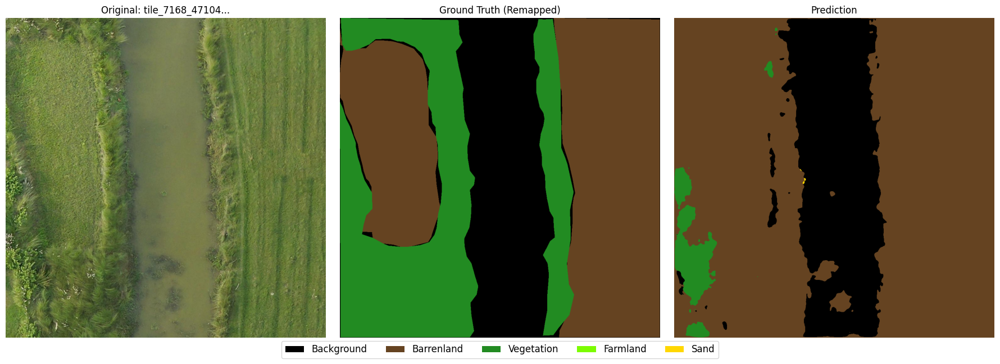

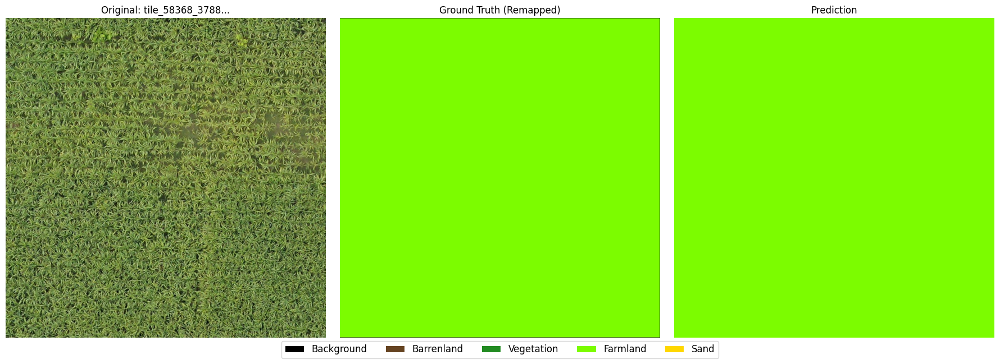

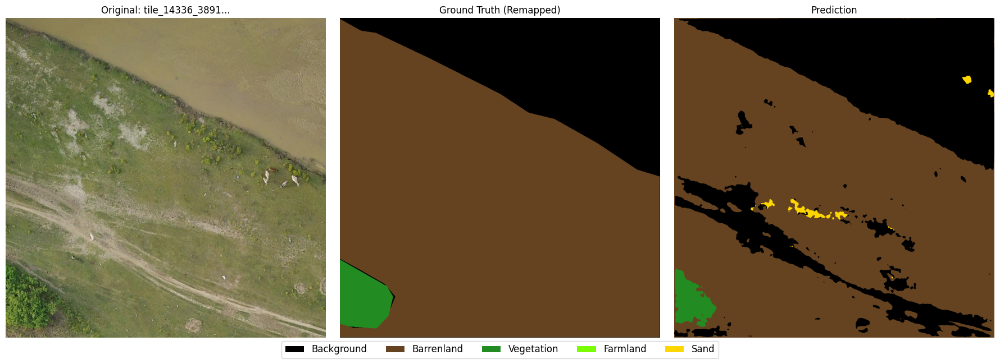

In [49]:
import os
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import models
import albumentations as A
from albumentations.pytorch import ToTensorV2
from matplotlib.patches import Patch

# ==========================================
# 1. CONFIGURATION
# ==========================================
CONFIG = {
    # Adjust these paths to match your exact folder structure
    "TEST_IMG_DIR": "/kaggle/working/test/images",
    "TEST_MASK_DIR": "/kaggle/working/test/masks",
    
    "MODEL_PATH": "vgg16_unet_best_dice.pth", # Ensure this matches your saved filename
    "IMG_SIZE": 512,
    "NUM_CLASSES": 5,   # 0:Back, 1:Barren, 2:Veg, 3:Farm, 4:Sand
    "DEVICE": "cuda" if torch.cuda.is_available() else "cpu",
    "NUM_SAMPLES": 5    # How many images to visualize
}

# Colors for Visualization (Matches your training config)
CLASS_COLORS = {
    0: [0, 0, 0],       # Background (Black)
    1: [101, 67, 33],   # Barrenland (Brown)
    2: [34, 139, 34],   # Vegetation (Forest Green)
    3: [124, 252, 0],   # Farmland (Lawn Green)
    4: [255, 215, 0],   # Sand (Gold)
}

ID2LABEL = {
    0: "Background",
    1: "Barrenland",
    2: "Vegetation",
    3: "Farmland",
    4: "Sand"
}

# ==========================================
# 2. MODEL DEFINITION
# ==========================================
class VGG16UNet(nn.Module):
    def __init__(self, num_classes, pretrained=False):
        super(VGG16UNet, self).__init__()
        # Load backbone without weights for inference
        vgg16 = models.vgg16_bn(weights=None)
        features = list(vgg16.features.children())

        self.enc1 = nn.Sequential(*features[:6])    
        self.enc2 = nn.Sequential(*features[6:13])  
        self.enc3 = nn.Sequential(*features[13:23]) 
        self.enc4 = nn.Sequential(*features[23:33]) 
        self.enc5 = nn.Sequential(*features[33:43]) 

        self.pool = nn.MaxPool2d(2, 2)

        self.up1 = self.conv_block(512 + 512, 512)
        self.up2 = self.conv_block(512 + 256, 256)
        self.up3 = self.conv_block(256 + 128, 128)
        self.up4 = self.conv_block(128 + 64, 64)

        self.final_conv = nn.Conv2d(64, num_classes, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        e1 = self.enc1(x)
        p1 = self.pool(e1)
        e2 = self.enc2(p1)
        p2 = self.pool(e2)
        e3 = self.enc3(p2)
        p3 = self.pool(e3)
        e4 = self.enc4(p3)
        p4 = self.pool(e4)
        e5 = self.enc5(p4)

        d1 = F.interpolate(e5, scale_factor=2, mode='bilinear', align_corners=True)
        if d1.size()[2:] != e4.size()[2:]:
            d1 = F.interpolate(d1, size=e4.shape[2:], mode='bilinear', align_corners=True)
        d1 = torch.cat([d1, e4], dim=1)
        d1 = self.up1(d1)

        d2 = F.interpolate(d1, scale_factor=2, mode='bilinear', align_corners=True)
        if d2.size()[2:] != e3.size()[2:]:
            d2 = F.interpolate(d2, size=e3.shape[2:], mode='bilinear', align_corners=True)
        d2 = torch.cat([d2, e3], dim=1)
        d2 = self.up2(d2)

        d3 = F.interpolate(d2, scale_factor=2, mode='bilinear', align_corners=True)
        if d3.size()[2:] != e2.size()[2:]:
            d3 = F.interpolate(d3, size=e2.shape[2:], mode='bilinear', align_corners=True)
        d3 = torch.cat([d3, e2], dim=1)
        d3 = self.up3(d3)

        d4 = F.interpolate(d3, scale_factor=2, mode='bilinear', align_corners=True)
        if d4.size()[2:] != e1.size()[2:]:
            d4 = F.interpolate(d4, size=e1.shape[2:], mode='bilinear', align_corners=True)
        d4 = torch.cat([d4, e1], dim=1)
        d4 = self.up4(d4)

        return self.final_conv(d4)

# ==========================================
# 3. HELPER FUNCTIONS
# ==========================================

def remap_gt_mask(mask):
    """
    Remaps the raw Ground Truth mask to match the model's training classes.
    """
    # Initialize as Background (0)
    new_mask = np.zeros_like(mask)
    
    # Map valid classes
    new_mask[mask == 1] = 1 # Barren
    new_mask[(mask == 2) | (mask == 5)] = 2 # Veg (Bush+Tree)
    new_mask[mask == 3] = 3 # Farm
    new_mask[mask == 4] = 4 # Sand
    
    # Note: Edgecase (6) and others become 0 (Background) for visualization purposes
    # so they appear black in the GT image.
    return new_mask

def colorize_mask(mask_2d):
    """Converts a 2D segmentation index map to a 3D RGB image."""
    h, w = mask_2d.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    
    for cls_id, color in CLASS_COLORS.items():
        color_mask[mask_2d == cls_id] = color
        
    return color_mask

def get_prediction(model, image_np, device):
    # Preprocess
    transform = A.Compose([
        A.Resize(height=CONFIG['IMG_SIZE'], width=CONFIG['IMG_SIZE']),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ])
    
    aug = transform(image=image_np)
    img_tensor = aug["image"].unsqueeze(0).to(device)
    
    # Predict
    with torch.no_grad():
        logits = model(img_tensor)
        # Resize to original image size
        logits = F.interpolate(logits, size=image_np.shape[:2], mode='bilinear', align_corners=False)
        pred_mask = torch.argmax(logits, dim=1).squeeze().cpu().numpy()
        
    return pred_mask

# ==========================================
# 4. MAIN INFERENCE LOOP
# ==========================================
def main():
    print("Loading Model...")
    model = VGG16UNet(num_classes=CONFIG['NUM_CLASSES'])
    
    if os.path.exists(CONFIG['MODEL_PATH']):
        model.load_state_dict(torch.load(CONFIG['MODEL_PATH'], map_location=CONFIG['DEVICE']))
        print("Weights loaded successfully.")
    else:
        print(f"Error: Model not found at {CONFIG['MODEL_PATH']}")
        return

    model.to(CONFIG['DEVICE'])
    model.eval()

    # Get images
    if not os.path.exists(CONFIG['TEST_IMG_DIR']):
        print(f"Directory not found: {CONFIG['TEST_IMG_DIR']}")
        return

    all_files = os.listdir(CONFIG['TEST_IMG_DIR'])
    images = sorted([f for f in all_files if f.endswith('.jpg')])

    if not images:
        print(f"No .jpg images found in {CONFIG['TEST_IMG_DIR']}")
        return

    print(f"Found {len(images)} images.")
    
    # Randomly select samples
    num_samples = min(CONFIG['NUM_SAMPLES'], len(images))
    selected_images = random.sample(images, num_samples)
    
    print(f"Visualizing {num_samples} samples...")

    for img_file in selected_images: 
        img_path = os.path.join(CONFIG['TEST_IMG_DIR'], img_file)
        
        # Mask Path Construction
        # Assumes: image.jpg -> masks/image_mask.png
        mask_file = img_file.replace(".jpg", "_mask.png")
        mask_path = os.path.join(CONFIG['TEST_MASK_DIR'], mask_file)
        
        # Load Image
        image_np = np.array(Image.open(img_path).convert("RGB"))
        
        # Load and Remap GT Mask
        if os.path.exists(mask_path):
            raw_mask = np.array(Image.open(mask_path).convert("L"))
            gt_mask_mapped = remap_gt_mask(raw_mask)
            gt_color = colorize_mask(gt_mask_mapped)
        else:
            print(f"Warning: No mask found for {img_file}")
            gt_color = np.zeros_like(image_np) # Black if missing

        # Get Prediction
        pred_mask = get_prediction(model, image_np, CONFIG['DEVICE'])
        pred_color = colorize_mask(pred_mask)

        # Plotting
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        
        # 1. Original Image
        axes[0].imshow(image_np)
        axes[0].set_title(f"Original: {img_file[:15]}...")
        axes[0].axis("off")
        
        # 2. Ground Truth
        axes[1].imshow(gt_color)
        axes[1].set_title("Ground Truth (Remapped)")
        axes[1].axis("off")
        
        # 3. Prediction
        axes[2].imshow(pred_color)
        axes[2].set_title("Prediction")
        axes[2].axis("off")
        
        # Legend
        legend_elements = [Patch(facecolor=np.array(c)/255, label=name) 
                           for i, (name, c) in zip(ID2LABEL.keys(), zip(ID2LABEL.values(), CLASS_COLORS.values()))]
        
        fig.legend(handles=legend_elements, loc='lower center', ncol=5, fontsize=12, bbox_to_anchor=(0.5, -0.05))
        
        plt.tight_layout()
        plt.show()

if __name__ == "__main__":
    main()

In [50]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import pandas as pd
from PIL import Image
from torchvision import models
import albumentations as A
from albumentations.pytorch import ToTensorV2
from tqdm import tqdm

# ==========================================
# 1. CONFIGURATION
# ==========================================
CONFIG = {
    # Adjust these to your actual test paths
    "TEST_IMG_DIR": "/kaggle/working/test/images", 
    "TEST_MASK_DIR": "/kaggle/working/test/masks",
    
    "MODEL_PATH": "vgg16_unet_best_dice.pth", # Ensure this matches your saved filename
    "IMG_SIZE": 512,
    "NUM_CLASSES": 5,  # 0:Back, 1:Barren, 2:Veg, 3:Farm, 4:Sand
    "IGNORE_INDEX": 255,
    "DEVICE": "cuda" if torch.cuda.is_available() else "cpu"
}

ID2LABEL = {
    0: "Background",
    1: "Barrenland",
    2: "Vegetation",
    3: "Farmland",
    4: "Sand"
}

# ==========================================
# 2. MODEL DEFINITION
# ==========================================
class VGG16UNet(nn.Module):
    def __init__(self, num_classes, pretrained=False):
        super(VGG16UNet, self).__init__()
        vgg16 = models.vgg16_bn(weights=None)
        features = list(vgg16.features.children())

        self.enc1 = nn.Sequential(*features[:6])    
        self.enc2 = nn.Sequential(*features[6:13])  
        self.enc3 = nn.Sequential(*features[13:23]) 
        self.enc4 = nn.Sequential(*features[23:33]) 
        self.enc5 = nn.Sequential(*features[33:43]) 

        self.pool = nn.MaxPool2d(2, 2)

        self.up1 = self.conv_block(512 + 512, 512)
        self.up2 = self.conv_block(512 + 256, 256)
        self.up3 = self.conv_block(256 + 128, 128)
        self.up4 = self.conv_block(128 + 64, 64)

        self.final_conv = nn.Conv2d(64, num_classes, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        e1 = self.enc1(x)
        p1 = self.pool(e1)
        e2 = self.enc2(p1)
        p2 = self.pool(e2)
        e3 = self.enc3(p2)
        p3 = self.pool(e3)
        e4 = self.enc4(p3)
        p4 = self.pool(e4)
        e5 = self.enc5(p4)

        d1 = F.interpolate(e5, scale_factor=2, mode='bilinear', align_corners=True)
        if d1.size()[2:] != e4.size()[2:]:
            d1 = F.interpolate(d1, size=e4.shape[2:], mode='bilinear', align_corners=True)
        d1 = torch.cat([d1, e4], dim=1)
        d1 = self.up1(d1)

        d2 = F.interpolate(d1, scale_factor=2, mode='bilinear', align_corners=True)
        if d2.size()[2:] != e3.size()[2:]:
            d2 = F.interpolate(d2, size=e3.shape[2:], mode='bilinear', align_corners=True)
        d2 = torch.cat([d2, e3], dim=1)
        d2 = self.up2(d2)

        d3 = F.interpolate(d2, scale_factor=2, mode='bilinear', align_corners=True)
        if d3.size()[2:] != e2.size()[2:]:
            d3 = F.interpolate(d3, size=e2.shape[2:], mode='bilinear', align_corners=True)
        d3 = torch.cat([d3, e2], dim=1)
        d3 = self.up3(d3)

        d4 = F.interpolate(d3, scale_factor=2, mode='bilinear', align_corners=True)
        if d4.size()[2:] != e1.size()[2:]:
            d4 = F.interpolate(d4, size=e1.shape[2:], mode='bilinear', align_corners=True)
        d4 = torch.cat([d4, e1], dim=1)
        d4 = self.up4(d4)

        return self.final_conv(d4)

# ==========================================
# 3. METRICS CALCULATOR CLASS
# ==========================================
class SegmentationMetrics:
    def __init__(self, num_classes, ignore_index=255):
        self.num_classes = num_classes
        self.ignore_index = ignore_index
        self.confusion_matrix = np.zeros((num_classes, num_classes))

    def update(self, preds, labels):
        preds_flat = preds.flatten()
        labels_flat = labels.flatten()

        # Filter out Ignore Indices
        mask = (labels_flat != self.ignore_index)
        
        preds_flat = preds_flat[mask]
        labels_flat = labels_flat[mask]

        count = np.bincount(
            self.num_classes * labels_flat.astype(int) + preds_flat.astype(int),
            minlength=self.num_classes ** 2
        )
        
        self.confusion_matrix += count.reshape(self.num_classes, self.num_classes)

    def compute_metrics(self):
        tp = np.diag(self.confusion_matrix)
        fp = self.confusion_matrix.sum(axis=0) - tp
        fn = self.confusion_matrix.sum(axis=1) - tp

        # Epsilon for numerical stability
        eps = 1e-10

        iou = tp / (tp + fp + fn + eps)
        precision = tp / (tp + fp + eps)
        recall = tp / (tp + fn + eps)
        dice = (2 * tp) / (2 * tp + fp + fn + eps)

        return {
            "IoU": iou,
            "Precision": precision,
            "Recall": recall,
            "Dice/F1": dice,
            "Confusion_Matrix": self.confusion_matrix
        }

# ==========================================
# 4. MAIN EXECUTION
# ==========================================
def main():
    print(f"Initializing Evaluation on {CONFIG['DEVICE']}...")
    
    # 1. Load Model
    model = VGG16UNet(num_classes=CONFIG['NUM_CLASSES'])
    if os.path.exists(CONFIG['MODEL_PATH']):
        model.load_state_dict(torch.load(CONFIG['MODEL_PATH'], map_location=CONFIG['DEVICE']))
    else:
        print(f"Error: Model not found at {CONFIG['MODEL_PATH']}")
        return
    model.to(CONFIG['DEVICE'])
    model.eval()

    # 2. Setup Metrics
    metrics = SegmentationMetrics(num_classes=CONFIG['NUM_CLASSES'], ignore_index=CONFIG['IGNORE_INDEX'])
    
    # 3. Preprocessing
    transform = A.Compose([
        A.Resize(height=CONFIG['IMG_SIZE'], width=CONFIG['IMG_SIZE']),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ])

    # 4. List Images
    if not os.path.exists(CONFIG['TEST_IMG_DIR']):
        print(f"Directory not found: {CONFIG['TEST_IMG_DIR']}")
        return

    all_files = os.listdir(CONFIG['TEST_IMG_DIR'])
    images = sorted([f for f in all_files if f.endswith('.jpg')])
    
    if len(images) == 0:
        print("No images found.")
        return

    print(f"Evaluating on {len(images)} images...")

    # 5. Evaluation Loop
    for img_file in tqdm(images):
        img_path = os.path.join(CONFIG['TEST_IMG_DIR'], img_file)
        
        mask_file = img_file.replace(".jpg", "_mask.png")
        mask_path = os.path.join(CONFIG['TEST_MASK_DIR'], mask_file)
        
        if not os.path.exists(mask_path): continue

        # Load Image
        image = np.array(Image.open(img_path).convert("RGB"))
        
        # Load Mask & Remap
        raw_mask = np.array(Image.open(mask_path).convert("L"))
        
        # --- Remapping Logic (Same as Training) ---
        gt_mask = np.zeros_like(raw_mask) # Default to 0 (Background)
        gt_mask[raw_mask == 1] = 1 # Barren
        gt_mask[(raw_mask == 2) | (raw_mask == 5)] = 2 # Veg
        gt_mask[raw_mask == 3] = 3 # Farm
        gt_mask[raw_mask == 4] = 4 # Sand
        
        # Ignore logic
        gt_mask[raw_mask == 6] = CONFIG["IGNORE_INDEX"]
        gt_mask[raw_mask > 6] = CONFIG["IGNORE_INDEX"]
        # ------------------------------------------

        # Preprocess
        aug = transform(image=image)
        img_tensor = aug["image"].unsqueeze(0).to(CONFIG['DEVICE'])

        # Inference
        with torch.no_grad():
            logits = model(img_tensor)
            # Resize logits to match Ground Truth size
            logits = F.interpolate(logits, size=gt_mask.shape, mode='bilinear', align_corners=False)
            pred_mask = torch.argmax(logits, dim=1).squeeze().cpu().numpy()

        # Update Metrics
        metrics.update(pred_mask, gt_mask)

    # 6. Calculate Final Scores
    scores = metrics.compute_metrics()
    
    # 7. Format Results into DataFrame
    results = []
    for i in range(CONFIG['NUM_CLASSES']):
        results.append({
            "Class ID": i,
            "Class Name": ID2LABEL[i],
            "IoU": scores["IoU"][i],
            "Dice (F1)": scores["Dice/F1"][i],
            "Precision": scores["Precision"][i],
            "Recall": scores["Recall"][i]
        })
    
    df = pd.DataFrame(results)
    
    # Calculate Mean IoU
    mIoU = np.nanmean(scores["IoU"])
    mDice = np.nanmean(scores["Dice/F1"])
    
    print("\n" + "="*60)
    print("FINAL EVALUATION REPORT")
    print("="*60)
    print(df.round(4).to_string(index=False))
    print("-" * 60)
    print(f"Mean IoU (mIoU):      {mIoU:.4f}")
    print(f"Mean Dice (mDice):    {mDice:.4f}")
    print("="*60)

    # Optional: Save to CSV
    df.to_csv("evaluation_metrics_final.csv", index=False)
    print("Metrics saved to 'evaluation_metrics_final.csv'")

if __name__ == "__main__":
    main()

Initializing Evaluation on cuda...
Evaluating on 25 images...


100%|██████████| 25/25 [00:01<00:00, 19.07it/s]


FINAL EVALUATION REPORT
 Class ID Class Name    IoU  Dice (F1)  Precision  Recall
        0 Background 0.4298     0.6012     0.5369  0.6831
        1 Barrenland 0.7530     0.8591     0.9264  0.8009
        2 Vegetation 0.4014     0.5729     0.8061  0.4444
        3   Farmland 0.8898     0.9417     0.9010  0.9863
        4       Sand 0.7105     0.8307     0.8510  0.8114
------------------------------------------------------------
Mean IoU (mIoU):      0.6369
Mean Dice (mDice):    0.7611
Metrics saved to 'evaluation_metrics_final.csv'


# trying morphological operation

Loading Model...
Visualizing 5 samples with Area-Based Cleaning...


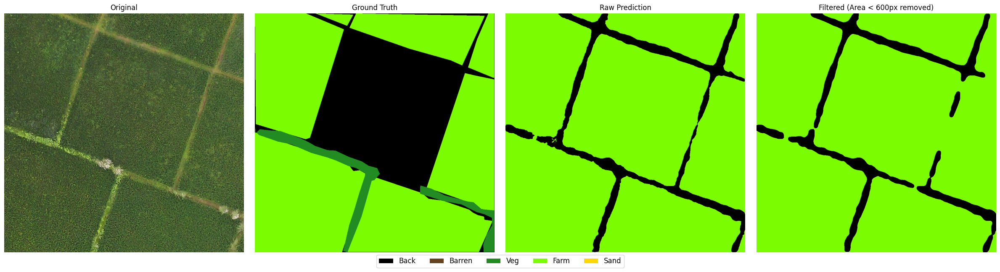

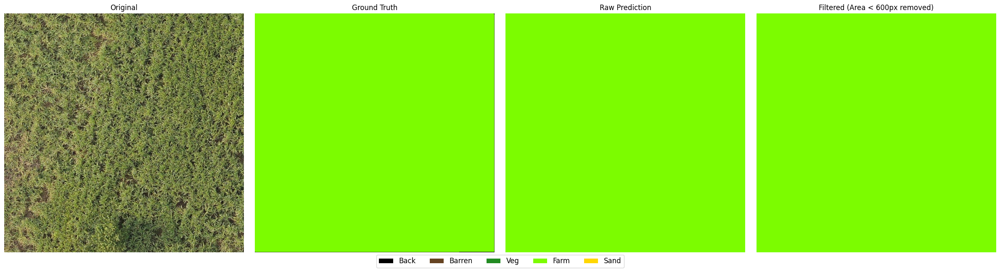

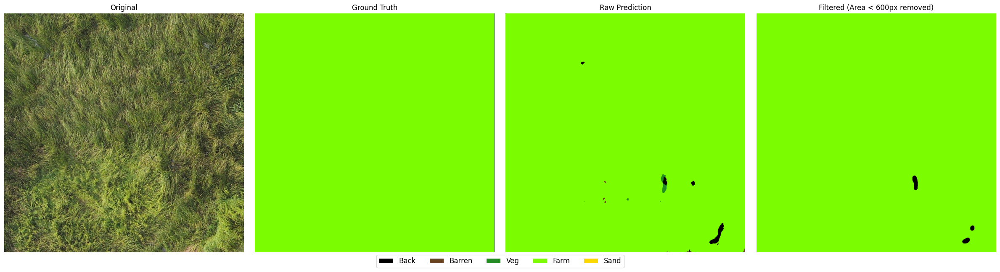

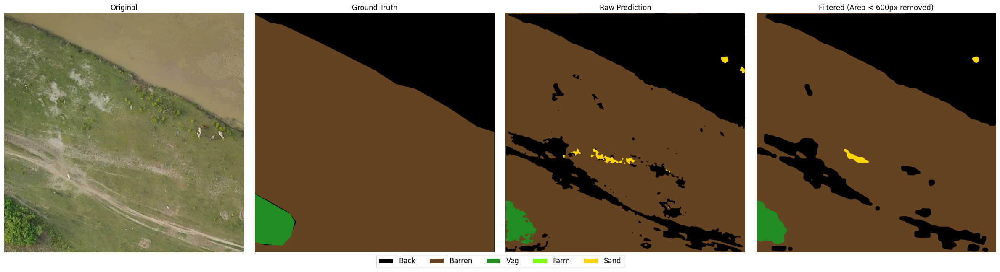

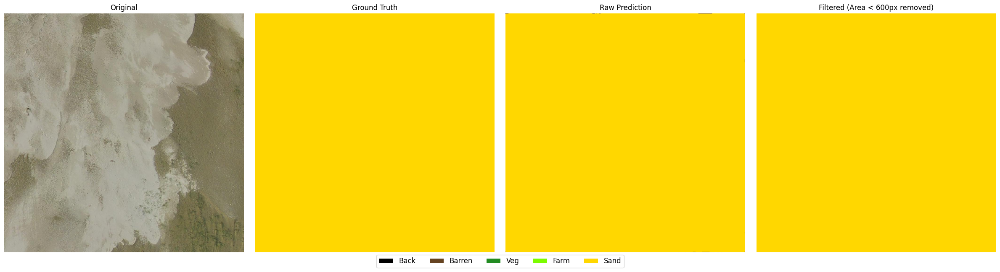

In [53]:
import os
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import models
import albumentations as A
from albumentations.pytorch import ToTensorV2
from matplotlib.patches import Patch
import cv2

# ==========================================
# 1. CONFIGURATION
# ==========================================
CONFIG = {
    "TEST_IMG_DIR": "/kaggle/working/test/images",
    "TEST_MASK_DIR": "/kaggle/working/test/masks",
    "MODEL_PATH": "vgg16_unet_best_dice.pth", 
    "IMG_SIZE": 512,
    "NUM_CLASSES": 5,   
    "DEVICE": "cuda" if torch.cuda.is_available() else "cpu",
    "NUM_SAMPLES": 5    
}

CLASS_COLORS = {
    0: [0, 0, 0],       # Background 
    1: [101, 67, 33],   # Barrenland 
    2: [34, 139, 34],   # Vegetation 
    3: [124, 252, 0],   # Farmland 
    4: [255, 215, 0],   # Sand 
}

ID2LABEL = {0: "Back", 1: "Barren", 2: "Veg", 3: "Farm", 4: "Sand"}

# ==========================================
# 2. MODEL
# ==========================================
class VGG16UNet(nn.Module):
    def __init__(self, num_classes, pretrained=False):
        super(VGG16UNet, self).__init__()
        vgg16 = models.vgg16_bn(weights=None)
        features = list(vgg16.features.children())
        self.enc1 = nn.Sequential(*features[:6])    
        self.enc2 = nn.Sequential(*features[6:13])  
        self.enc3 = nn.Sequential(*features[13:23]) 
        self.enc4 = nn.Sequential(*features[23:33]) 
        self.enc5 = nn.Sequential(*features[33:43]) 
        self.pool = nn.MaxPool2d(2, 2)
        self.up1 = self.conv_block(512 + 512, 512)
        self.up2 = self.conv_block(512 + 256, 256)
        self.up3 = self.conv_block(256 + 128, 128)
        self.up4 = self.conv_block(128 + 64, 64)
        self.final_conv = nn.Conv2d(64, num_classes, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        e1 = self.enc1(x)
        p1 = self.pool(e1)
        e2 = self.enc2(p1)
        p2 = self.pool(e2)
        e3 = self.enc3(p2)
        p3 = self.pool(e3)
        e4 = self.enc4(p3)
        p4 = self.pool(e4)
        e5 = self.enc5(p4)
        d1 = F.interpolate(e5, scale_factor=2, mode='bilinear', align_corners=True)
        if d1.size()[2:] != e4.size()[2:]: d1 = F.interpolate(d1, size=e4.shape[2:], mode='bilinear')
        d1 = torch.cat([d1, e4], dim=1)
        d1 = self.up1(d1)
        d2 = F.interpolate(d1, scale_factor=2, mode='bilinear', align_corners=True)
        if d2.size()[2:] != e3.size()[2:]: d2 = F.interpolate(d2, size=e3.shape[2:], mode='bilinear')
        d2 = torch.cat([d2, e3], dim=1)
        d2 = self.up2(d2)
        d3 = F.interpolate(d2, scale_factor=2, mode='bilinear', align_corners=True)
        if d3.size()[2:] != e2.size()[2:]: d3 = F.interpolate(d3, size=e2.shape[2:], mode='bilinear')
        d3 = torch.cat([d3, e2], dim=1)
        d3 = self.up3(d3)
        d4 = F.interpolate(d3, scale_factor=2, mode='bilinear', align_corners=True)
        if d4.size()[2:] != e1.size()[2:]: d4 = F.interpolate(d4, size=e1.shape[2:], mode='bilinear')
        d4 = torch.cat([d4, e1], dim=1)
        d4 = self.up4(d4)
        return self.final_conv(d4)

# ==========================================
# 3. IMPROVED POST-PROCESSING (AREA FILTER)
# ==========================================

def clean_segmentation_mask(mask, min_area=600):
    """
    1. Removes blobs smaller than `min_area` (set to 0).
    2. Uses Closing to fill the 0s with surrounding neighbors.
    3. Uses Median Blur to smooth edges.
    """
    # Convert to uint8
    mask = mask.astype(np.uint8)
    cleaned = mask.copy()
    
    # A. Remove Small Objects
    # Iterate valid classes (skip background 0)
    for class_id in [1, 2, 3, 4]:
        binary = (mask == class_id).astype(np.uint8)
        # Find blobs
        contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        for cnt in contours:
            if cv2.contourArea(cnt) < min_area:
                # Fill small blobs with 0 (Background)
                cv2.drawContours(cleaned, [cnt], -1, 0, -1)
    
    # B. Fill Holes (The 0s we just created)
    # We use a large kernel to let neighbors grow into the empty space
    kernel = np.ones((15, 15), np.uint8)
    cleaned = cv2.morphologyEx(cleaned, cv2.MORPH_CLOSE, kernel)
    
    # C. Smooth Edges
    cleaned = cv2.medianBlur(cleaned, 11)
    
    return cleaned

def remap_gt_mask(mask):
    new_mask = np.zeros_like(mask)
    new_mask[mask == 1] = 1 
    new_mask[(mask == 2) | (mask == 5)] = 2 
    new_mask[mask == 3] = 3 
    new_mask[mask == 4] = 4 
    return new_mask

def colorize_mask(mask_2d):
    h, w = mask_2d.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for cls_id, color in CLASS_COLORS.items():
        color_mask[mask_2d == cls_id] = color
    return color_mask

def get_prediction(model, image_np, device):
    transform = A.Compose([
        A.Resize(height=CONFIG['IMG_SIZE'], width=CONFIG['IMG_SIZE']),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ])
    
    aug = transform(image=image_np)
    img_tensor = aug["image"].unsqueeze(0).to(device)
    
    with torch.no_grad():
        logits = model(img_tensor)
        logits = F.interpolate(logits, size=image_np.shape[:2], mode='bilinear', align_corners=False)
        pred_mask = torch.argmax(logits, dim=1).squeeze().cpu().numpy()
        
    return pred_mask

# ==========================================
# 4. MAIN INFERENCE LOOP
# ==========================================
def main():
    print("Loading Model...")
    model = VGG16UNet(num_classes=CONFIG['NUM_CLASSES'])
    
    if os.path.exists(CONFIG['MODEL_PATH']):
        model.load_state_dict(torch.load(CONFIG['MODEL_PATH'], map_location=CONFIG['DEVICE']))
    else:
        print(f"Error: Model not found at {CONFIG['MODEL_PATH']}")
        return

    model.to(CONFIG['DEVICE'])
    model.eval()

    if not os.path.exists(CONFIG['TEST_IMG_DIR']):
        print(f"Directory not found")
        return

    all_files = os.listdir(CONFIG['TEST_IMG_DIR'])
    images = sorted([f for f in all_files if f.endswith('.jpg')])

    if not images:
        print(f"No .jpg images found")
        return

    num_samples = min(CONFIG['NUM_SAMPLES'], len(images))
    selected_images = random.sample(images, num_samples)
    
    print(f"Visualizing {num_samples} samples with Area-Based Cleaning...")

    for img_file in selected_images: 
        img_path = os.path.join(CONFIG['TEST_IMG_DIR'], img_file)
        mask_file = img_file.replace(".jpg", "_mask.png")
        mask_path = os.path.join(CONFIG['TEST_MASK_DIR'], mask_file)
        
        # 1. Load Data
        image_np = np.array(Image.open(img_path).convert("RGB"))
        
        if os.path.exists(mask_path):
            raw_mask = np.array(Image.open(mask_path).convert("L"))
            gt_mask_mapped = remap_gt_mask(raw_mask)
            gt_color = colorize_mask(gt_mask_mapped)
        else:
            gt_color = np.zeros_like(image_np)

        # 2. Get Raw Prediction
        raw_pred_mask = get_prediction(model, image_np, CONFIG['DEVICE'])
        
        # 3. Apply Post-Processing (Area Filter)
        # min_area=600 means any blob smaller than ~25x25 pixels gets deleted
        cleaned_pred_mask = clean_segmentation_mask(raw_pred_mask, min_area=600)
        
        # 4. Colorize
        raw_pred_color = colorize_mask(raw_pred_mask)
        clean_pred_color = colorize_mask(cleaned_pred_mask)

        # 5. Visualize
        fig, axes = plt.subplots(1, 4, figsize=(24, 6))
        
        axes[0].imshow(image_np)
        axes[0].set_title(f"Original")
        axes[0].axis("off")
        
        axes[1].imshow(gt_color)
        axes[1].set_title("Ground Truth")
        axes[1].axis("off")
        
        axes[2].imshow(raw_pred_color)
        axes[2].set_title("Raw Prediction")
        axes[2].axis("off")
        
        axes[3].imshow(clean_pred_color)
        axes[3].set_title("Filtered (Area < 600px removed)")
        axes[3].axis("off")
        
        legend_elements = [Patch(facecolor=np.array(c)/255, label=name) 
                           for i, (name, c) in zip(ID2LABEL.keys(), zip(ID2LABEL.values(), CLASS_COLORS.values()))]
        
        fig.legend(handles=legend_elements, loc='lower center', ncol=5, fontsize=12, bbox_to_anchor=(0.5, -0.05))
        plt.tight_layout()
        plt.show()

if __name__ == "__main__":
    main()